# https://www.kaggle.com/datafiniti/consumer-reviews-of-amazon-products

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re,string
import spacy
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

### importing and data preprocessing

In [2]:
df_1=pd.read_csv('amazon product review/1429_1.csv')
df_2=pd.read_csv('amazon product review/1429_2.csv')
df_3=pd.read_csv('amazon product review/1429_3.csv')

D:\Anaconda\envs\deep_learning\lib\site-packages\IPython\core\interactiveshell.py:3072: DtypeWarning: Columns (1,10) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
df_1.head(5)

,id,name,asins,brand,categories,keys,manufacturer,reviews.date,reviews.dateAdded,reviews.dateSeen,...,reviews.doRecommend,reviews.id,reviews.numHelpful,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username
0,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-13T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",...,True,NaN,0.0,5.0,http://reviews.bestbuy.com/3545/5620406/review...,This product so far has not disappointed. My c...,Kindle,NaN,NaN,Adapter
1,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-13T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",...,True,NaN,0.0,5.0,http://reviews.bestbuy.com/3545/5620406/review...,great for beginner or experienced person. Boug...,very fast,NaN,NaN,truman
2,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-13T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",...,True,NaN,0.0,5.0,http://reviews.bestbuy.com/3545/5620406/review...,Inexpensive tablet for him to use and learn on...,Beginner tablet for our 9 year old son.,NaN,NaN,DaveZ
3,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-13T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",...,True,NaN,0.0,4.0,http://reviews.bestbuy.com/3545/5620406/review...,I've had my Fire HD 8 two weeks now and I love...,Good!!!,NaN,NaN,Shacks
4,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-12T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",...,True,NaN,0.0,5.0,http://reviews.bestbuy.com/3545/5620406/review...,I bought this for my grand daughter when she c...,Fantastic Tablet for kids,NaN,NaN,explore42


In [4]:
df_1=df_1[['name','reviews.doRecommend','reviews.numHelpful','reviews.text']]

In [5]:
df_1.head()

,name,reviews.doRecommend,reviews.numHelpful,reviews.text
0,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",True,0.0,This product so far has not disappointed. My c...
1,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",True,0.0,great for beginner or experienced person. Boug...
2,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",True,0.0,Inexpensive tablet for him to use and learn on...
3,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",True,0.0,I've had my Fire HD 8 two weeks now and I love...
4,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",True,0.0,I bought this for my grand daughter when she c...


In [6]:
df_1.isnull().sum()

name                   6760
reviews.doRecommend     594
reviews.numHelpful      529
reviews.text              1
dtype: int64

In [7]:
df_1['reviews.doRecommend'].fillna(False,inplace=True)
df_1['reviews.numHelpful'].fillna(0.,inplace=True)

In [8]:
df_1['reviews.doRecommend']=df_1['reviews.doRecommend'].astype('int')
df_1['reviews.numHelpful']=df_1['reviews.numHelpful'].astype('int')

In [9]:
df_1.dropna(inplace=True)

In [10]:
df_2=df_2[['name','reviews.doRecommend','reviews.numHelpful','reviews.text']]
df_2['reviews.doRecommend'].fillna(False,inplace=True)
df_2['reviews.numHelpful'].fillna(0.,inplace=True)
df_2['reviews.doRecommend']=df_2['reviews.doRecommend'].astype('int')
df_2['reviews.numHelpful']=df_2['reviews.numHelpful'].astype('int')
df_2.dropna(inplace=True)

In [11]:
df_3=df_3[['name','reviews.doRecommend','reviews.numHelpful','reviews.text']]
df_3['reviews.doRecommend'].fillna(False,inplace=True)
df_3['reviews.numHelpful'].fillna(0.,inplace=True)
df_3['reviews.doRecommend']=df_3['reviews.doRecommend'].astype('int')
df_3['reviews.numHelpful']=df_3['reviews.numHelpful'].astype('int')
df_3.dropna(inplace=True)

In [12]:
new_df=df_1.append(df_2,ignore_index=True)

In [13]:
df=new_df.append(df_3,ignore_index=True)

In [14]:
df

,name,reviews.doRecommend,reviews.numHelpful,reviews.text
0,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",1,0,This product so far has not disappointed. My c...
1,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",1,0,great for beginner or experienced person. Boug...
2,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",1,0,Inexpensive tablet for him to use and learn on...
3,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",1,0,I've had my Fire HD 8 two weeks now and I love...
4,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",1,0,I bought this for my grand daughter when she c...
...,...,...,...,...
61226,"Fire Tablet with Alexa, 7"" Display, 16 GB, Mag...",1,0,This is a great tablet for the price. Amazon i...
61227,"Fire Tablet with Alexa, 7"" Display, 16 GB, Mag...",1,1,This tablet is the perfect size and so easy to...
61228,"Fire Tablet with Alexa, 7"" Display, 16 GB, Mag...",1,8,Purchased this for my son. Has room to upgrade...
61229,"Fire Tablet with Alexa, 7"" Display, 16 GB, Mag...",1,0,I had some thoughts about getting this for a 5...


In [15]:
df=df.groupby('name').filter(lambda x: len(x)>50).reset_index(drop=True)

In [16]:
df['name']=df['name'].apply(lambda x: x.split(',,,')[0])

In [17]:
contraction_mapping = {"ain't": "is not", "aren't": "are not","can't": "cannot", "'cause": "because", "could've": "could have", "couldn't": "could not",

                           "didn't": "did not", "doesn't": "does not", "don't": "do not", "hadn't": "had not", "hasn't": "has not", "haven't": "have not",

                           "he'd": "he would","he'll": "he will", "he's": "he is", "how'd": "how did", "how'd'y": "how do you", "how'll": "how will", "how's": "how is",

                           "I'd": "I would", "I'd've": "I would have", "I'll": "I will", "I'll've": "I will have","I'm": "I am", "I've": "I have", "i'd": "i would",

                           "i'd've": "i would have", "i'll": "i will",  "i'll've": "i will have","i'm": "i am", "i've": "i have", "isn't": "is not", "it'd": "it would",

                           "it'd've": "it would have", "it'll": "it will", "it'll've": "it will have","it's": "it is", "let's": "let us", "ma'am": "madam",

                           "mayn't": "may not", "might've": "might have","mightn't": "might not","mightn't've": "might not have", "must've": "must have",

                           "mustn't": "must not", "mustn't've": "must not have", "needn't": "need not", "needn't've": "need not have","o'clock": "of the clock",

                           "oughtn't": "ought not", "oughtn't've": "ought not have", "shan't": "shall not", "sha'n't": "shall not", "shan't've": "shall not have",

                           "she'd": "she would", "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have", "she's": "she is",

                           "should've": "should have", "shouldn't": "should not", "shouldn't've": "should not have", "so've": "so have","so's": "so as",

                           "this's": "this is","that'd": "that would", "that'd've": "that would have", "that's": "that is", "there'd": "there would",

                           "there'd've": "there would have", "there's": "there is", "here's": "here is","they'd": "they would", "they'd've": "they would have",

                           "they'll": "they will", "they'll've": "they will have", "they're": "they are", "they've": "they have", "to've": "to have",

                           "wasn't": "was not", "we'd": "we would", "we'd've": "we would have", "we'll": "we will", "we'll've": "we will have", "we're": "we are",

                           "we've": "we have", "weren't": "were not", "what'll": "what will", "what'll've": "what will have", "what're": "what are",

                           "what's": "what is", "what've": "what have", "when's": "when is", "when've": "when have", "where'd": "where did", "where's": "where is",

                           "where've": "where have", "who'll": "who will", "who'll've": "who will have", "who's": "who is", "who've": "who have",

                           "why's": "why is", "why've": "why have", "will've": "will have", "won't": "will not", "won't've": "will not have",

                           "would've": "would have", "wouldn't": "would not", "wouldn't've": "would not have", "y'all": "you all",

                           "y'all'd": "you all would","y'all'd've": "you all would have","y'all're": "you all are","y'all've": "you all have",

                           "you'd": "you would", "you'd've": "you would have", "you'll": "you will", "you'll've": "you will have",

                           "you're": "you are", "you've": "you have"}

In [18]:
def clean_text(doc):
    text=doc.lower()
    pattern=re.compile('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+')
    text=pattern.sub('',text)
    text=' '.join([contraction_mapping[t] if t in contraction_mapping else t for t in text.split(' ')])
    return text
def preprocessing(df):
    doc=[]
    lines=df['reviews.text'].values.tolist()
    for line in lines:
        text=clean_text(line)
        text=word_tokenize(text)
        table=str.maketrans('','',string.punctuation)
        text=[w.translate(table) for w in text]
        stop_words=set(stopwords.words('english'))
        text=[w for w in text if w not in stop_words]
        text=[w for w in text if w.isalpha()]
        text=' '.join(text)
        doc.append(text)
    return doc

In [19]:
cleaned_review=preprocessing(df)

In [20]:
df['cleaned_review']=cleaned_review

## EDA

In [21]:
nlp=spacy.load('en_core_web_md',disable=['parser','ner'])

In [22]:
df['lemmatized']=df['cleaned_review'].apply(lambda x : ' '.join(token.lemma_ for token in list(nlp(x))))

In [23]:
df_group=df[['name','lemmatized']].groupby('name').agg(lambda x: ' '.join(x))

In [24]:
df_group

,lemmatized
name,
"All-New Fire 7 Tablet with Alexa, 7"" Display, 8 GB - Marine Blue",amazing way keep kid read also game get father...
"All-New Fire HD 8 Kids Edition Tablet, 8 HD Display, 32 GB, Blue Kid-Proof Case",want get tablet grandson however mother insist...
"All-New Fire HD 8 Kids Edition Tablet, 8 HD Display, 32 GB, Pink Kid-Proof Case",purchase amazon fire hd kids edition year old ...
"All-New Fire HD 8 Tablet with Alexa, 8 HD Display, 16 GB, Marine Blue - with Special Offers",tablet offer much fun expect good product grea...
"All-New Fire HD 8 Tablet with Alexa, 8 HD Display, 32 GB, Marine Blue - with Special Offers",easy small child use kid friendly always pleas...
"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Black",app miss due use google play store list minima...
"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Blue",love fire late sharp fast still handle great g...
"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Magenta",product far disappointed child love use like a...
"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 32 GB - Includes Special Offers, Black",purchase replace fire hd leave plane find retu...


In [25]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
data=cv.fit_transform(df_group.lemmatized)
df_dtm=pd.DataFrame(data.toarray(),columns=cv.get_feature_names())
df_dtm.index=df_group.index

In [26]:
from wordcloud import WordCloud
from textwrap import wrap

In [33]:
def world_cloud(data,title):
    wc=WordCloud(width=400,height=300,max_words=100,colormap='Dark2').generate_from_frequencies(data)
    plt.figure(figsize=(12,8))
    plt.axis('off')
    plt.imshow(wc,interpolation='bilinear')
    plt.title(' '.join(wrap(title,60)),fontsize=13)
    plt.show()

In [28]:
df_dtm=df_dtm.transpose()

In [29]:
df_dtm

name,"All-New Fire 7 Tablet with Alexa, 7"" Display, 8 GB - Marine Blue","All-New Fire HD 8 Kids Edition Tablet, 8 HD Display, 32 GB, Blue Kid-Proof Case","All-New Fire HD 8 Kids Edition Tablet, 8 HD Display, 32 GB, Pink Kid-Proof Case","All-New Fire HD 8 Tablet with Alexa, 8 HD Display, 16 GB, Marine Blue - with Special Offers","All-New Fire HD 8 Tablet with Alexa, 8 HD Display, 32 GB, Marine Blue - with Special Offers","All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Black","All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Blue","All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Magenta","All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 32 GB - Includes Special Offers, Black","All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 32 GB - Includes Special Offers, Blue",...,"Fire Tablet, 7 Display, Wi-Fi, 16 GB - Includes Special Offers, Black","Fire Tablet, 7 Display, Wi-Fi, 8 GB - Includes Special Offers, Black","Fire Tablet, 7 Display, Wi-Fi, 8 GB - Includes Special Offers, Magenta","Kindle E-reader - White, 6 Glare-Free Touchscreen Display, Wi-Fi - Includes Special Offers","Kindle Oasis E-reader with Leather Charging Cover - Black, 6 High-Resolution Display (300 ppi), Wi-Fi - Includes Special Offers","Kindle Oasis E-reader with Leather Charging Cover - Merlot, 6 High-Resolution Display (300 ppi), Wi-Fi - Includes Special Offers","Kindle Oasis E-reader with Leather Charging Cover - Merlot, 6 High-Resolution Display (300 ppi), Wi-Fi - Includes Special Offers,,","Kindle Oasis E-reader with Leather Charging Cover - Walnut, 6 High-Resolution Display (300 ppi), Wi-Fi - Includes Special Offers","Kindle Voyage E-reader, 6 High-Resolution Display (300 ppi) with Adaptive Built-in Light, PagePress Sensors, Wi-Fi - Includes Special Offers","Kindle Voyage E-reader, 6 High-Resolution Display (300 ppi) with Adaptive Built-in Light, PagePress Sensors, Wi-Fi - Includes Special Offers,"
aa,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aaa,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aaaa,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aaaaa,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aaai,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zooming,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
zr,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ztotop,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zwave,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## most occurance words from the reviews for perticular products

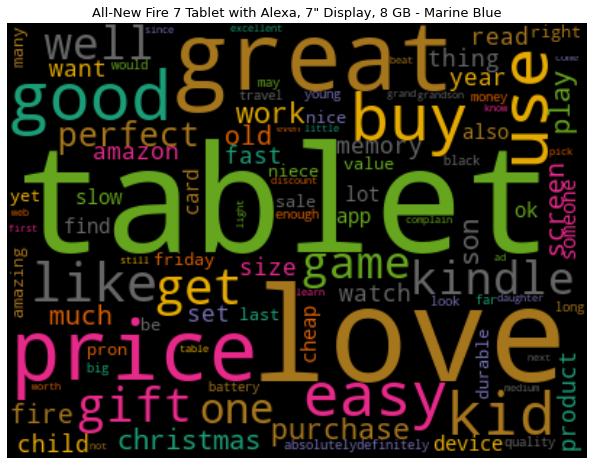

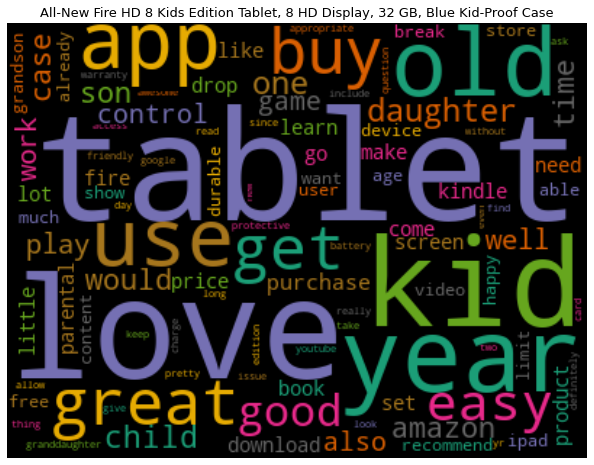

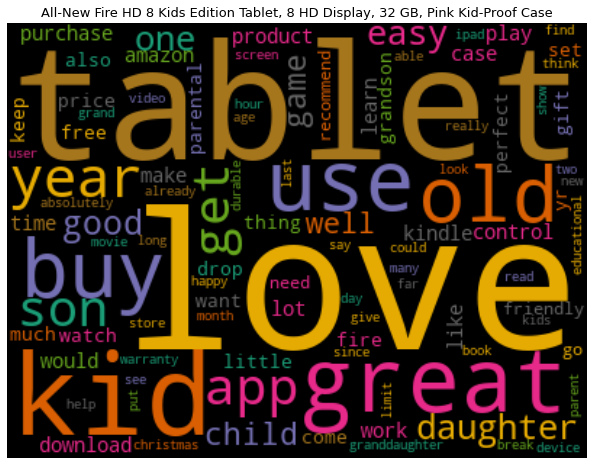

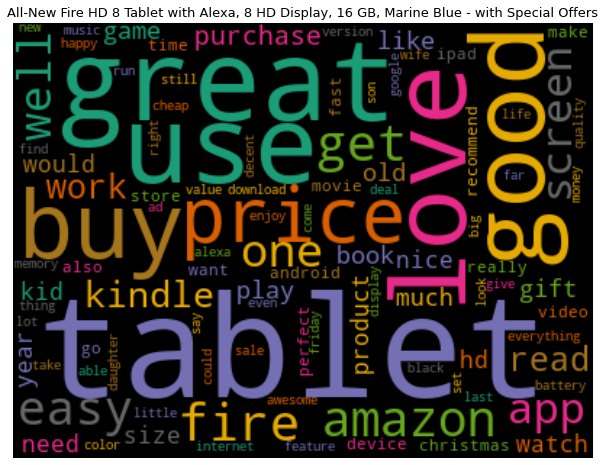

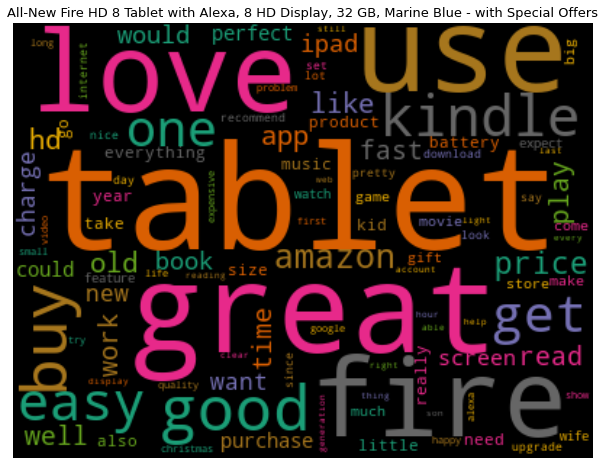

...

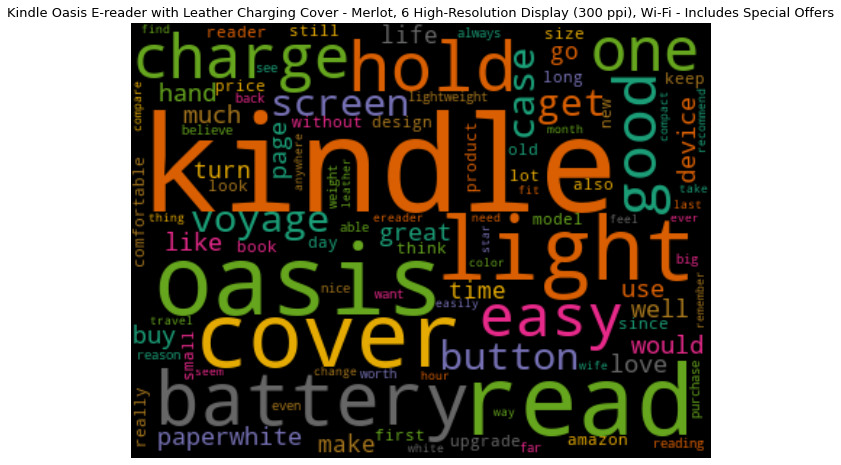

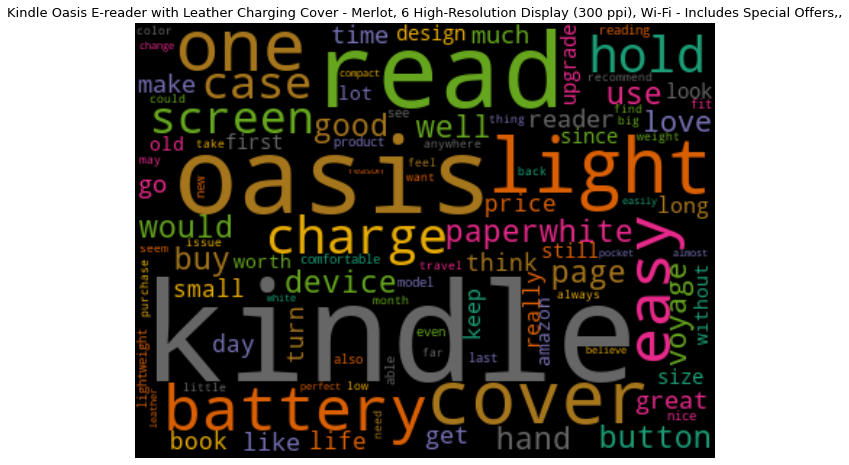

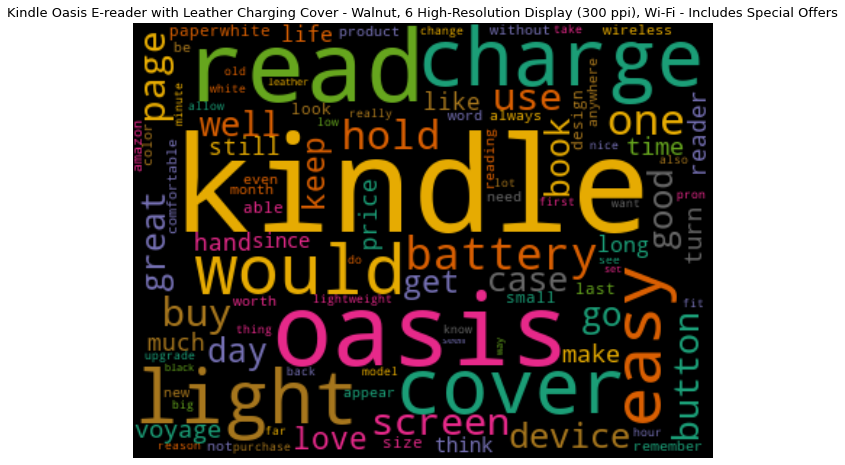

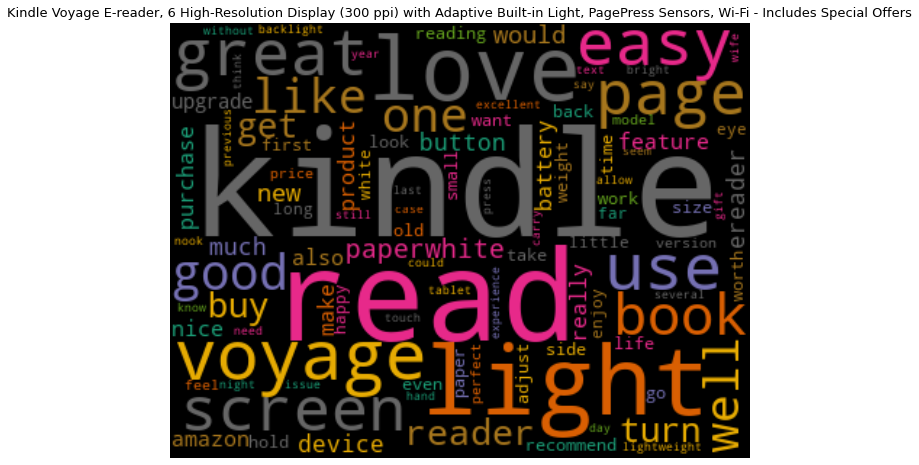

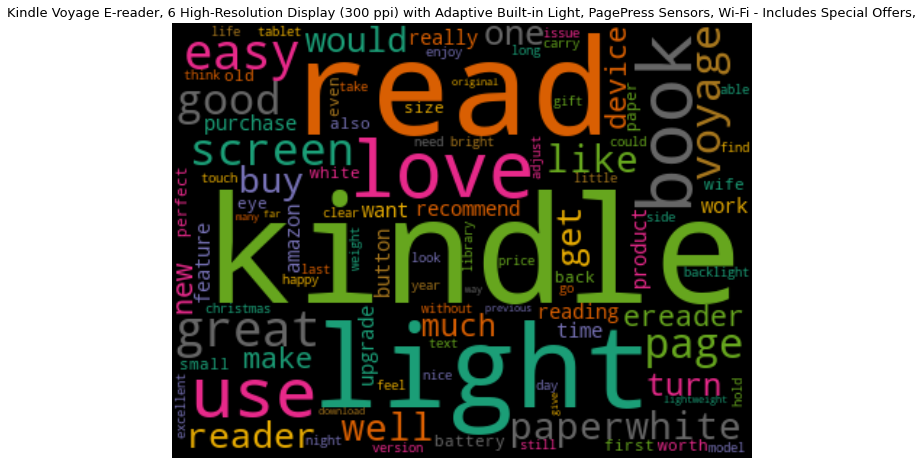

In [34]:
for index,product in enumerate(df_dtm.columns):
    world_cloud(df_dtm[product].sort_values(ascending=False),product)

## cheaking the polarity of reviews

In [35]:
from textblob import TextBlob

In [36]:
df_group['polarity']=df_group.lemmatized.apply(lambda x: TextBlob(x).sentiment.polarity)

In [37]:
df_group.polarity.sort_values(ascending=False).reset_index()

,name,polarity
0,"Amazon Fire Hd 10 Tablet, Wi-Fi, 16 Gb, Specia...",0.365380
1,Amazon - Echo Plus w/ Built-In Hub - Silver,0.364950
2,Amazon Tap Smart Assistant Alexaenabled (black...,0.357247
3,Amazon Tap - Alexa-Enabled Portable Bluetooth ...,0.356870
4,Amazon - Amazon Tap Portable Bluetooth and Wi-...,0.351826
5,"Fire Tablet with Alexa, 7"" Display, 16 GB, Mag...",0.349458
6,"Amazon Fire HD 8 with Alexa (8"" HD Display Tab...",0.347979
7,Amazon Echo Show Alexa-enabled Bluetooth Speak...,0.347168
8,Echo (White),0.343052
9,"Brand New Amazon Kindle Fire 16gb 7"" Ips Displ...",0.342927


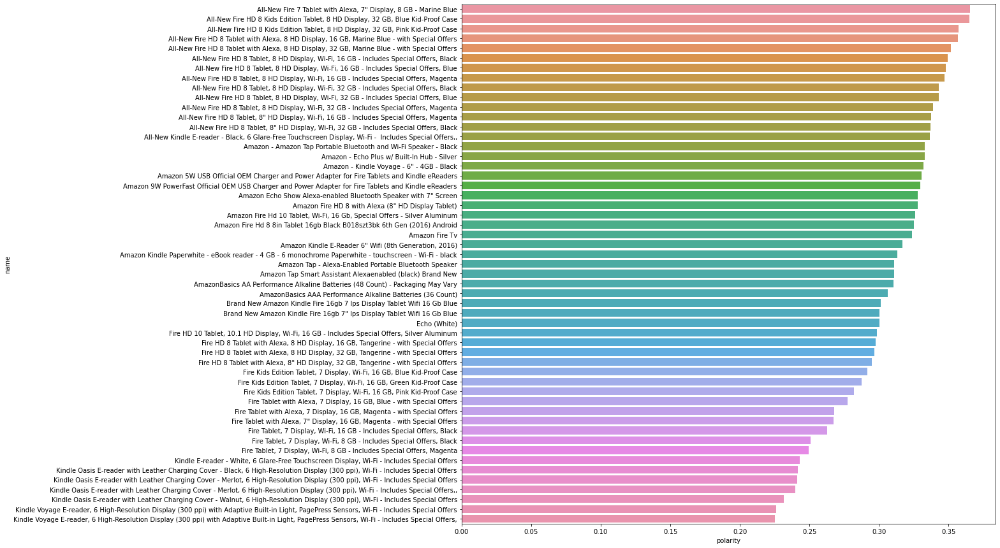

In [39]:
plt.figure(figsize=(15,15))
sns.barplot(df_group.polarity.sort_values(ascending=False),df_group.index,data=df)

## finding most recommended products by customers in ascending order

In [48]:
((df.groupby('name')['reviews.doRecommend'].sum()/df.groupby('name')['reviews.doRecommend'].size())*100).sort_values(ascending=False).reset_index()

,name,reviews.doRecommend
0,Amazon Fire Hd 8 8in Tablet 16gb Black B018szt...,98.518519
1,Amazon Kindle Paperwhite - eBook reader - 4 GB...,97.953401
2,"Kindle Voyage E-reader, 6 High-Resolution Disp...",97.931034
3,"Amazon Fire HD 8 with Alexa (8"" HD Display Tab...",97.692308
4,Amazon - Echo Plus w/ Built-In Hub - Silver,97.627119
5,"Kindle Voyage E-reader, 6 High-Resolution Disp...",97.623762
6,Amazon - Amazon Tap Portable Bluetooth and Wi-...,97.484277
7,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",97.457627
8,"Fire Tablet with Alexa, 7"" Display, 16 GB, Mag...",97.029703
9,"All-New Fire HD 8 Kids Edition Tablet, 8 HD Di...",96.928328


## checking the readiability of the reviews

In [49]:
import textstat

In [51]:
df['text_standard']=df['reviews.text'].apply(lambda x: textstat.text_standard(x))

In [53]:
df['text_standard'].mode()

0    5th and 6th grade
dtype: object

#### found that most of the reviews are too easy that can understable by 5th or 6th standard students

## reading time

In [54]:
df['read_time']=df['reviews.text'].apply(lambda x: textstat.reading_time(x))

In [55]:
df['read_time'].mean()

1.763560182666469

#### so average reading time of review is 1.76 min(an adult on an average can read 250 words per minute)

In [60]:
print('The average reading time of helpfull review is :',df[df['reviews.numHelpful']>1]['read_time'].mean())
print('The average reading time of not helpfull review is :',df[df['reviews.numHelpful']<1]['read_time'].mean())

The average reading time of helpfull review is : 4.371494505494506
The average reading time of not helpfull review is : 1.6509705277344306


#### we can conclude that lentghy reviews are more helpful.